In [133]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

from sklearn.tree import export_graphviz
import pydotplus
from IPython.display import Image

In [134]:
path = "titanic_full.xls"
data = pd.read_excel(path)

In [135]:
data.head(3)

,pclass,survived,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,boat,body,home.dest
0,1,1,"Allen, Miss. Elisabeth Walton",female,29.0000,0,0,24160,211.3375,B5,S,2,NaN,"St Louis, MO"
1,1,1,"Allison, Master. Hudson Trevor",male,0.9167,1,2,113781,151.5500,C22 C26,S,11,NaN,"Montreal, PQ / Chesterville, ON"
2,1,0,"Allison, Miss. Helen Loraine",female,2.0000,1,2,113781,151.5500,C22 C26,S,NaN,NaN,"Montreal, PQ / Chesterville, ON"


In [136]:
# Информация о датасете
data.info()

# Статистика по числовым данным
data.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1309 entries, 0 to 1308
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   pclass     1309 non-null   int64  
 1   survived   1309 non-null   int64  
 2   name       1309 non-null   object 
 3   sex        1309 non-null   object 
 4   age        1046 non-null   float64
 5   sibsp      1309 non-null   int64  
 6   parch      1309 non-null   int64  
 7   ticket     1309 non-null   object 
 8   fare       1308 non-null   float64
 9   cabin      295 non-null    object 
 10  embarked   1307 non-null   object 
 11  boat       486 non-null    object 
 12  body       121 non-null    float64
 13  home.dest  745 non-null    object 
dtypes: float64(3), int64(4), object(7)
memory usage: 143.3+ KB


,pclass,survived,age,sibsp,parch,fare,body
count,1309.000000,1309.000000,1046.000000,1309.000000,1309.000000,1308.000000,121.000000
mean,2.294882,0.381971,29.881135,0.498854,0.385027,33.295479,160.809917
std,0.837836,0.486055,14.413500,1.041658,0.865560,51.758668,97.696922
min,1.000000,0.000000,0.166700,0.000000,0.000000,0.000000,1.000000
25%,2.000000,0.000000,21.000000,0.000000,0.000000,7.895800,72.000000
50%,3.000000,0.000000,28.000000,0.000000,0.000000,14.454200,155.000000
75%,3.000000,1.000000,39.000000,1.000000,0.000000,31.275000,256.000000
max,3.000000,1.000000,80.000000,8.000000,9.000000,512.329200,328.000000


In [137]:
# Проверка наличия пропущенных значений
data.isnull().sum()

pclass          0
survived        0
name            0
sex             0
age           263
sibsp           0
parch           0
ticket          0
fare            1
cabin        1014
embarked        2
boat          823
body         1188
home.dest     564
dtype: int64

In [138]:
columns_to_drop = ['name', 'sibsp', 'parch', 'ticket', 'cabin', 'boat', 'body', 'home.dest']
data.drop(columns=columns_to_drop, inplace=True)
data.head()

,pclass,survived,sex,age,fare,embarked
0,1,1,female,29.0000,211.3375,S
1,1,1,male,0.9167,151.5500,S
2,1,0,female,2.0000,151.5500,S
3,1,0,male,30.0000,151.5500,S
4,1,0,female,25.0000,151.5500,S


In [139]:
data['sex'].replace({'male': 1, 'female': 0}, inplace=True)
data['embarked'].replace({'S': 3, 'Q': 1, 'C': 2}, inplace=True)
data['embarked'] = data['embarked'].astype(float)
data.dropna(subset=['age', 'fare', 'embarked'], inplace=True)

In [140]:
# Проверка наличия пропущенных значений
data.isnull().sum()

pclass      0
survived    0
sex         0
age         0
fare        0
embarked    0
dtype: int64

In [141]:
X = data.drop(columns=['survived'])
y = data['survived']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

print("Размерность обучающей выборки (признаки):", X_train.shape)
print("Размерность тестовой выборки (признаки):", X_test.shape)
print("Размерность обучающей выборки (целевая переменная):", y_train.shape)
print("Размерность тестовой выборки (целевая переменная):", y_test.shape)

Размерность обучающей выборки (признаки): (834, 5)
Размерность тестовой выборки (признаки): (209, 5)
Размерность обучающей выборки (целевая переменная): (834,)
Размерность тестовой выборки (целевая переменная): (209,)


Accuracy BaggingClassifier: 0.7511961722488039
Precision BaggingClassifier: 0.7466666666666667
Recall BaggingClassifier: 0.6292134831460674
F1-score BaggingClassifier: 0.6829268292682926


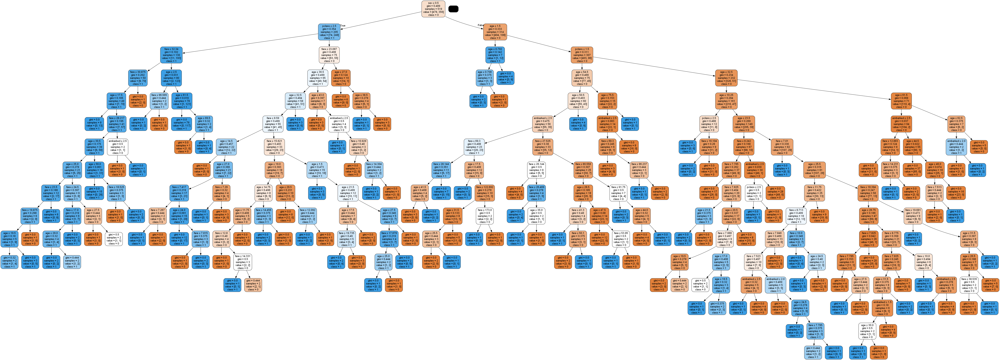

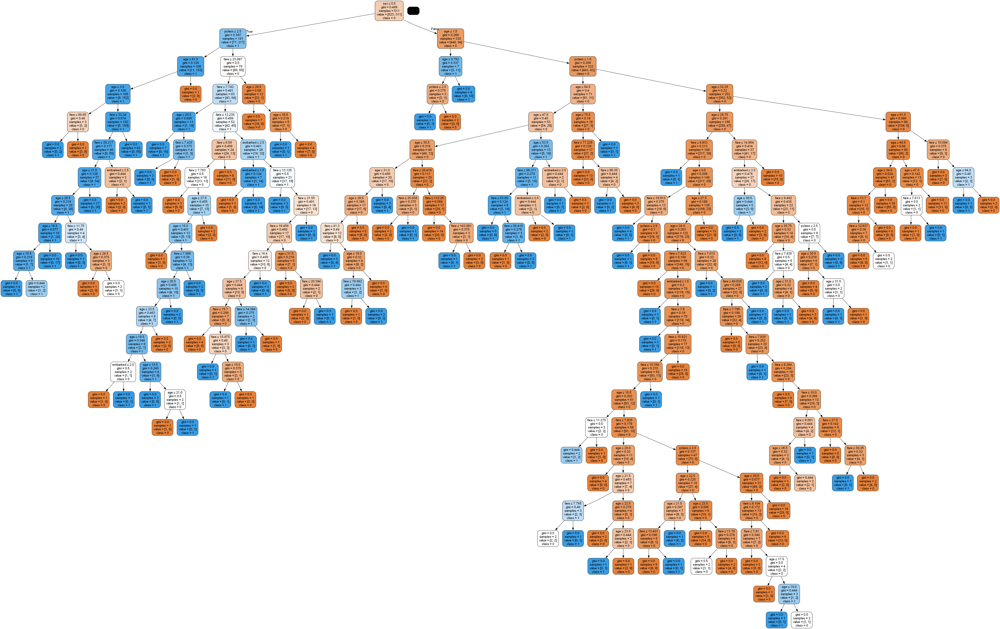

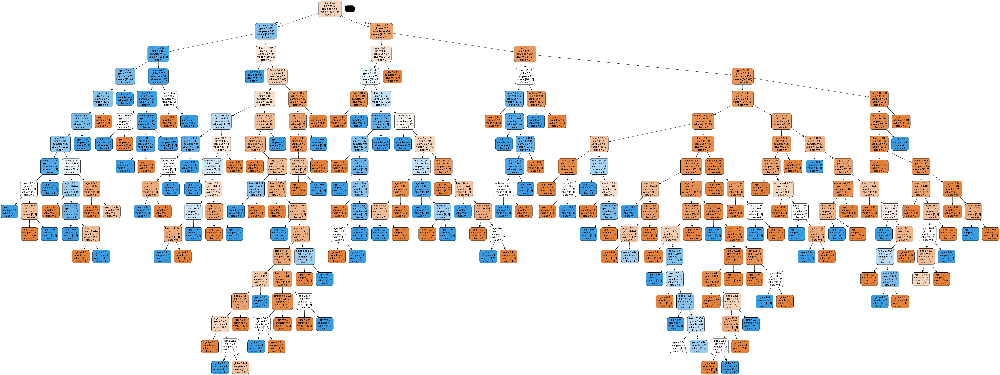

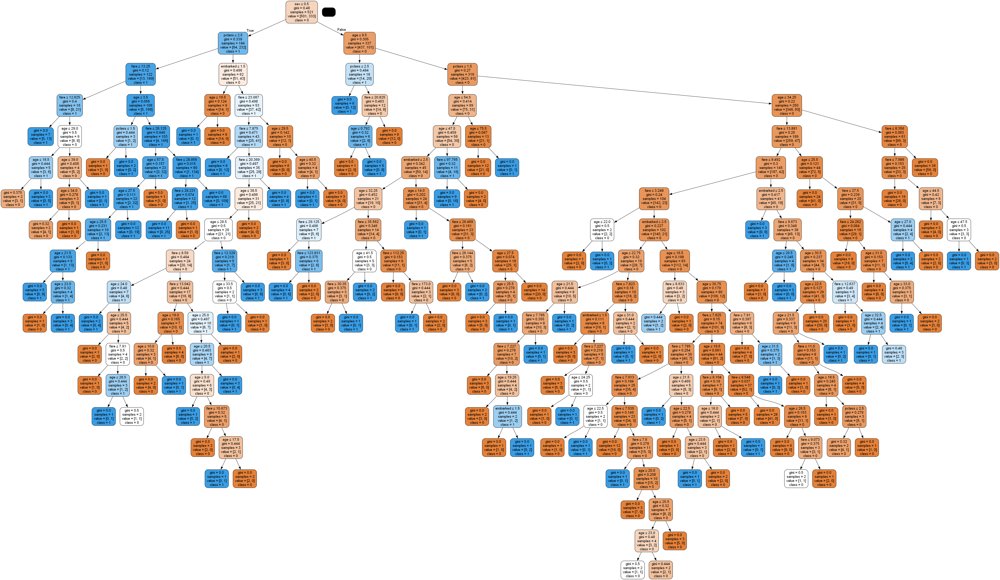

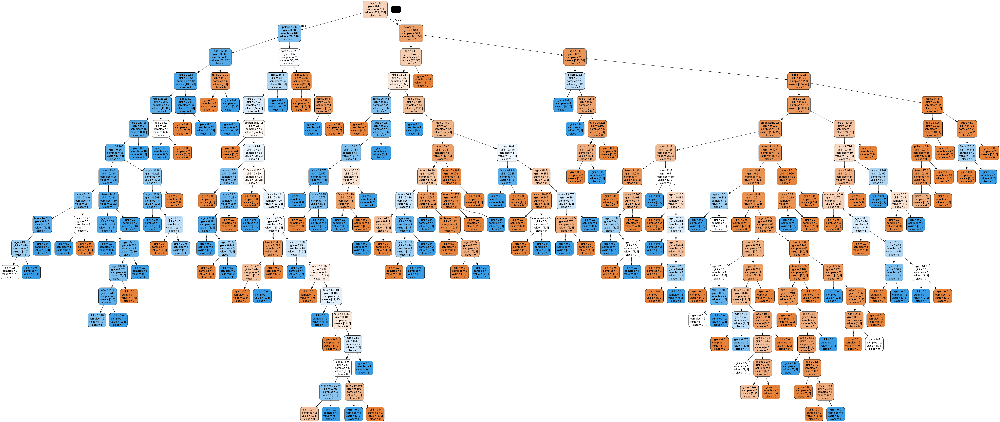

In [142]:
base_classifier = DecisionTreeClassifier()

bagging_model = BaggingClassifier(base_classifier, n_estimators=5)
bagging_model.fit(X_train, y_train)

bagging_predictions = bagging_model.predict(X_test)

bagging_accuracy = accuracy_score(y_test, bagging_predictions)
print("Accuracy BaggingClassifier:", bagging_accuracy)

bagging_precision = precision_score(y_test, bagging_predictions)
print("Precision BaggingClassifier:", bagging_precision)

bagging_recall = recall_score(y_test, bagging_predictions)
print("Recall BaggingClassifier:", bagging_recall)

bagging_f1_score = f1_score(y_test, bagging_predictions)
print("F1-score BaggingClassifier:", bagging_f1_score)

# Получение всех деревьев решений
base_classifiers = bagging_model.estimators_

# Визуализация каждого дерева решений
for i, tree in enumerate(base_classifiers):
    dot_data = export_graphviz(tree, out_file=None, 
                               feature_names=X_train.columns,  
                               class_names=['0', '1'],  
                               filled=True, rounded=True,  
                               special_characters=True)  
    graph = pydotplus.graph_from_dot_data(dot_data)  
    
    # Визуализация
    display(Image(graph.create_png()))

Accuracy RandomForestClassifier: 0.7320574162679426
Precision RandomForestClassifier: 0.7088607594936709
Recall RandomForestClassifier: 0.6292134831460674
F1-score RandomForestClassifier: 0.6666666666666667


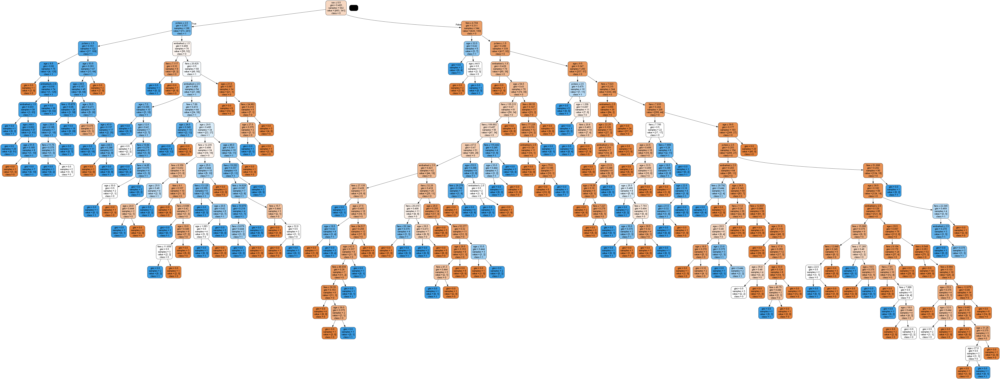

In [143]:
random_forest_model = RandomForestClassifier(n_estimators=5)
random_forest_model.fit(X_train, y_train)

random_forest_predictions = random_forest_model.predict(X_test)

random_forest_accuracy = accuracy_score(y_test, random_forest_predictions)
print("Accuracy RandomForestClassifier:", random_forest_accuracy)
 
random_forest_precision = precision_score(y_test, random_forest_predictions)
print("Precision RandomForestClassifier:", random_forest_precision)

random_forest_recall = recall_score(y_test, random_forest_predictions)
print("Recall RandomForestClassifier:", random_forest_recall)

random_forest_f1_score = f1_score(y_test, random_forest_predictions)
print("F1-score RandomForestClassifier:", random_forest_f1_score)

# Получение первого дерева из модели случайного леса и его визуализация
tree = random_forest_model.estimators_[0]
dot_data = export_graphviz(tree, out_file=None, 
                           feature_names=X_train.columns,  
                           class_names=['0', '1'],  
                           filled=True, rounded=True,  
                           special_characters=True)  

graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())

In [144]:
base_classifier = DecisionTreeClassifier(max_depth=1)

adaboost_model = AdaBoostClassifier(base_classifier, n_estimators=50)

adaboost_model.fit(X_train, y_train)

adaboost_predictions = adaboost_model.predict(X_test)

adaboost_accuracy = accuracy_score(y_test, adaboost_predictions)
print("Accuracy AdaBoostClassifier:", adaboost_accuracy)

adaboost_precision = precision_score(y_test, adaboost_predictions)
print("Precision AdaBoostClassifier:", adaboost_precision)
 
adaboost_recall = recall_score(y_test, adaboost_predictions)
print("Recall AdaBoostClassifier:", adaboost_recall)

adaboost_f1_score = f1_score(y_test, adaboost_predictions)
print("F1-score AdaBoostClassifier:", adaboost_f1_score)

Accuracy AdaBoostClassifier: 0.784688995215311
Precision AdaBoostClassifier: 0.7558139534883721
Recall AdaBoostClassifier: 0.7303370786516854
F1-score AdaBoostClassifier: 0.7428571428571429


In [145]:
gradient_boosting_model = GradientBoostingClassifier()
gradient_boosting_model.fit(X_train, y_train)
gradient_boosting_predictions = gradient_boosting_model.predict(X_test)

gradient_boosting_accuracy = accuracy_score(y_test, gradient_boosting_predictions)
print("Accuracy GradientBoostingClassifier:", gradient_boosting_accuracy)

gradient_boosting_precision = precision_score(y_test, gradient_boosting_predictions)
print("Precision GradientBoostingClassifier:", gradient_boosting_precision)

gradient_boosting_recall = recall_score(y_test, gradient_boosting_predictions)
print("Recall GradientBoostingClassifier:", gradient_boosting_recall)

gradient_boosting_f1_score = f1_score(y_test, gradient_boosting_predictions)
print("F1-score GradientBoostingClassifier:", gradient_boosting_f1_score)

Accuracy GradientBoostingClassifier: 0.7559808612440191
Precision GradientBoostingClassifier: 0.7638888888888888
Recall GradientBoostingClassifier: 0.6179775280898876
F1-score GradientBoostingClassifier: 0.6832298136645962
